# Investment Home for AirBnB Rental

## Introduction

Airbnb is a global service that gives a chance to rent your home or your room and provide service for guests at reasonable prices. It is much more profitable on a daily basis. My business plan is to create a company that provides house and hotel-grade service with housekeeping in Istanbul. My company decided to buy 4 houses at various locations in Istanbul. Istanbul is a historical and popular place to visit. For that reason, we are wondering which locations are suitable. We are evaluating these locations with AirBnB House data in Istanbul data and hotel distribution. 


## Data

I'm using the AirBnB Istanbul data (AirBnB, 2020) for first and locating popular neighborhoods. I've used the k-means clustering algorithm for determining centroids of Airbnb houses. After that, I've evaluated hotels around centroid locations with Foursquare API (Foursquare, 2020). Hotels are normally distributed in popular places. I'm using the number of hotels around AirBnB data centroids for evaluating locations and creating data models. Than, I'll be compare AirBnB incomes (Price and ) with House price indexes at these locations from Endeksa (Endeksa, 2020).

AirBnB data consists 16 columns and 16251 rows. The columns are id, name, host_id, host_name, neighbourhood_group, neighbourhood, latitude, longitude, room_type,price,minimum_nights, number_of_reviews, last_review, reviews_per_month, calculated_host_listings_count, availability_365. We are usign geospatial data, price, room type and neighbourhood values from this dataset. We only evaluated Entire home rentals in this data set. After the cleaning NaN calues and room_type filtering 7191 rows remains.

We have used Hotel data for calculating popularity of neghborhoods on touristic level. Hotem number increases with popularity and historical importance. Tourists wants to stay inside the popular and historical places at İstanbul. Hotel data has been retrieved from Foursquare API. 

House prices amnd monthly rental prices can retrieved from Endeksa. Endeksa provides house price and monthly rental price from statistical datas and investigations.


In [ ]:
import pandas as pd
import numpy as np
import requests # library to handle requests
from IPython.display import Image 
from IPython.core.display import HTML 
from pandas.io.json import json_normalize
!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library
!conda install -c conda-forge geopy --yes 
!conda install scikit-learn --yes 
import matplotlib.pyplot as plt # plotting library
# backend for rendering plots within the browser
%matplotlib inline 
from sklearn.cluster import KMeans 
from sklearn.datasets.samples_generator import make_blobs
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
!pip install numpy_financial
import numpy_financial as npf
CLIENT_ID = 'RP5YK5X14JFM05SLCT34JMMQ3ZXXTDDEDKB2WXS5ULSKAY3H' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 500
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

### Retrieving Data

In [2]:
df = pd.read_csv("AirbnbIstanbul.csv")

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,4826,The Place,6603,Kaan,NaN,Uskudar,41.05650,29.05367,Entire home/apt,554,1,1,2009-06-01,0.01,1,365
1,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06984,29.04545,Entire home/apt,100,30,41,2018-11-07,0.38,2,49
2,25436,House for vacation rental furnutare,105823,Yesim,NaN,Besiktas,41.07731,29.03891,Entire home/apt,211,21,0,NaN,NaN,1,83
3,27271,LOVELY APT. IN PERFECT LOCATION,117026,Mutlu,NaN,Beyoglu,41.03220,28.98216,Entire home/apt,237,5,2,2018-05-04,0.04,1,228
4,28277,Duplex Apartment with Terrace,121607,Alen,NaN,Sisli,41.04471,28.98567,Entire home/apt,591,3,0,NaN,NaN,13,356


In [4]:
df.shape

(16251, 16)

In [5]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [6]:
df.neighbourhood.unique()

array(['Uskudar', 'Besiktas', 'Beyoglu', 'Sisli', 'Sariyer', 'Beykoz',
       'Atasehir', 'Fatih', 'Adalar', 'Kadikoy', 'Kagithane', 'Maltepe',
       'Bakirkoy', 'Esenyurt', 'Basaksehir', 'Kartal', 'Gaziosmanpasa',
       'Bahcelievler', 'Bagcilar', 'Buyukcekmece', 'Silivri',
       'Beylikduzu', 'Umraniye', 'Sile', 'Cekmekoy', 'Sancaktepe',
       'Tuzla', 'Pendik', 'Sultangazi', 'Eyup', 'Zeytinburnu',
       'Kucukcekmece', 'Avcilar', 'Gungoren', 'Catalca', 'Bayrampasa',
       'Esenler', 'Sultanbeyli', 'Arnavutkoy'], dtype=object)

In [7]:
df.room_type.unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [8]:
rental = df[df['room_type']=='Entire home/apt']

In [9]:
rental.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,4826,The Place,6603,Kaan,NaN,Uskudar,41.05650,29.05367,Entire home/apt,554,1,1,2009-06-01,0.01,1,365
1,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06984,29.04545,Entire home/apt,100,30,41,2018-11-07,0.38,2,49
2,25436,House for vacation rental furnutare,105823,Yesim,NaN,Besiktas,41.07731,29.03891,Entire home/apt,211,21,0,NaN,NaN,1,83
3,27271,LOVELY APT. IN PERFECT LOCATION,117026,Mutlu,NaN,Beyoglu,41.03220,28.98216,Entire home/apt,237,5,2,2018-05-04,0.04,1,228
4,28277,Duplex Apartment with Terrace,121607,Alen,NaN,Sisli,41.04471,28.98567,Entire home/apt,591,3,0,NaN,NaN,13,356


In [88]:
rental = rental.dropna(subset=['latitude','longitude','price', 'neighbourhood'])
rental.shape

(7191, 16)

In [11]:
places = rental['neighbourhood'].value_counts().to_frame()

In [91]:
data_istanbul = {'lat':41.015137, 'lon': 28.979530 }
venues_map = folium.Map(location=[data_istanbul['lat'], data_istanbul['lon']], zoom_start=11)

for lat,lon in zip(rental['latitude'], rental['longitude']):
        folium.features.CircleMarker(
        [lat, lon],
        radius=3,
        color='blue',
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

venues_map

In [12]:
popular_places = places[places['neighbourhood']>500]
popular_places = popular_places.index.values
popular_places = popular_places.tolist()
popular_places

['Beyoglu', 'Sisli', 'Fatih', 'Kadikoy', 'Besiktas']

In [13]:
rental_popular = rental[rental['neighbourhood'].isin(popular_places)]

In [14]:
data_istanbul = {'lat':41.015137, 'lon': 28.979530 }
venues_map = folium.Map(location=[data_istanbul['lat'], data_istanbul['lon']], zoom_start=11)

for lat,lon in zip(rental_popular['latitude'], rental_popular['longitude']):
        folium.features.CircleMarker(
        [lat, lon],
        radius=3,
        color='blue',
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

venues_map

In [15]:
loc_df = pd.DataFrame([rental_popular["latitude"], rental_popular["longitude"]]).transpose()
loc_mx = loc_df.to_numpy()
loc_mx

array([[41.06984, 29.04545],
       [41.07731, 29.03891],
       [41.0322 , 28.98216],
       ...,
       [41.04062, 28.98155],
       [41.04775, 28.99283],
       [41.04775, 28.99283]])

In [16]:
k_means = KMeans(init="k-means++", n_clusters=30, n_init=50, max_iter=1000, tol=0.00001)

In [17]:
k_means.fit(loc_mx)

KMeans(max_iter=1000, n_clusters=30, n_init=50, tol=1e-05)

In [18]:
centroids = k_means.cluster_centers_

In [20]:
df_centroids = pd.DataFrame([],columns=['CentroidNumber', 'Latitude', 'Longitude', 'HotelNumber'])
i = 0
for latitude,longitude in centroids:
    search_query = 'Hotel'
    radius = 100
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
    results = requests.get(url).json()
    venues = results['response']['venues']
    numberHotel = len(venues)
    tempSeries = pd.Series([i, latitude, longitude, numberHotel], index=df_centroids.columns)
    df_centroids = df_centroids.append(tempSeries, ignore_index=True)
    i = i+1

In [21]:
temp_df = pd.DataFrame([df_centroids['Latitude'], df_centroids['Longitude'], df_centroids['CentroidNumber']]).transpose().to_numpy()
for lat,lon,cnum in temp_df:
        folium.features.CircleMarker([lat, lon], radius=3, color='red').add_to(venues_map)
venues_map

In [22]:
df_centroids

,CentroidNumber,Latitude,Longitude,HotelNumber
0,0.0,41.005063,28.968760,19.0
1,1.0,41.026964,28.974881,18.0
2,2.0,40.994516,29.031281,0.0
3,3.0,41.068864,28.997351,0.0
4,4.0,41.039260,28.982542,50.0
5,5.0,40.973243,29.072367,0.0
6,6.0,41.072583,29.041322,0.0
7,7.0,41.029557,28.947106,0.0
8,8.0,41.047663,28.984725,4.0
9,9.0,41.115889,29.012199,0.0


In [23]:
len(df_centroids[df_centroids['HotelNumber'] > 10])

4

In [24]:
candidate_centroids = df_centroids[df_centroids['HotelNumber'] > 10]

In [25]:
candidate_centroids

,CentroidNumber,Latitude,Longitude,HotelNumber
0,0.0,41.005063,28.968760,19.0
1,1.0,41.026964,28.974881,18.0
4,4.0,41.039260,28.982542,50.0
26,26.0,41.035337,28.974617,19.0


In [26]:
for lat,lon in zip(candidate_centroids['Latitude'], candidate_centroids['Longitude']):
        folium.features.CircleMarker(
        [lat, lon],
        radius=5,
        color='green',
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)
        
venues_map

Candidate places at İstanbul is in Fatih and Beyoglu. When we look at deeply the place at Fatih is located at Kumkapı. On the other side, The places at Beyoglu is located at Taksim, Tepebaşı and Tarlabaşı.

## House Prices and Payback Period of Investment

### AirBnB Daily Rental Prices

Mean AirBnB prices at Fatih and Beyoglu can be investigated for montly AirBnB Rental.

Daily Mean Price at Beyoglu is 373.1771495877503
Daily Median Price at Beyoglu is 227.0


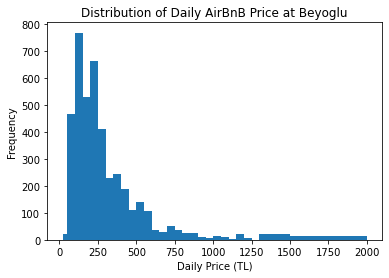

In [27]:
plt.hist(df[df['neighbourhood'] == 'Beyoglu'].price, bins=[20,50,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200,1250,1300,1500,2000])
plt.xlabel('Daily Price (TL)')
plt.ylabel('Frequency')
plt.title('Distribution of Daily AirBnB Price at Beyoglu')
print('Daily Mean Price at Beyoglu is {}'.format(df[df['neighbourhood'] == 'Beyoglu'].price.mean()))
print('Daily Median Price at Beyoglu is {}'.format(df[df['neighbourhood'] == 'Beyoglu'].price.median()))
plt.show()

Daily Mean Price at Fatih is 498.9310344827586
Daily Median Price at Fatih is 240.0


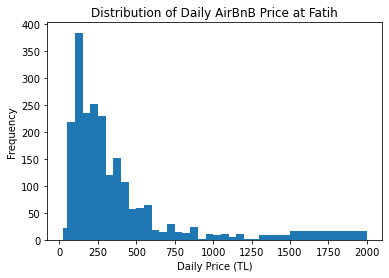

In [28]:
plt.hist(df[df['neighbourhood'] == 'Fatih'].price, bins=[20,50,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200,1250,1300,1500,2000])
plt.xlabel('Daily Price (TL)')
plt.ylabel('Frequency')
plt.title('Distribution of Daily AirBnB Price at Fatih')
print('Daily Mean Price at Fatih is {}'.format(df[df['neighbourhood'] == 'Fatih'].price.mean()))
print('Daily Median Price at Fatih is {}'.format(df[df['neighbourhood'] == 'Fatih'].price.median()))
plt.show()

According to frequency, prices located between 100 and 500 TL per day. Daily Rental for Beyoglu is selected 450 TL per day and Daily Rental for Fatih is Selected 500 TL per day. Occupancy rate at montly basis is assumed %45 percent of the month. Monthly prices are:

In [29]:
fatih_monthly_rental = 500*30*0.45
beyoglu_monthly_rental = 450*30*0.45
print('Monthly airBnB rental prices of {} and {} is {} TL and {} TL per month, respectively.'.format('Beyoglu', 'Fatih', beyoglu_monthly_rental, fatih_monthly_rental))

Monthly airBnB rental prices of Beyoglu and Fatih is 6075.0 TL and 6750.0 TL per month, respectively.


### House Prices and Monthly Rental Income at Candidate Location

The prices have been calculated for 120 m^2 home. The values based on per m^2 is gained from http://www.endeksa.com. According to Candidate Places there are 4 Positions. These are Kumkapı, Tarlabaşı, Tepebaşı and Taksim. The prices can be found following.

In [30]:
candidate_prices = pd.DataFrame([['Kumkapi',513840, 1312,fatih_monthly_rental ], ['Tarlabasi', 335430, 1555, beyoglu_monthly_rental], ['Tepebasi',420495,1620, beyoglu_monthly_rental],['Taksim',1495000, 3300, beyoglu_monthly_rental]], columns=['Location', 'priceHouse', 'priceMonthlyRental', 'priceMonthlyAirBnB'])
candidate_prices = candidate_prices.set_index('Location')
candidate_prices

,priceHouse,priceMonthlyRental,priceMonthlyAirBnB
Location,,,
Kumkapi,513840,1312,6750.0
Tarlabasi,335430,1555,6075.0
Tepebasi,420495,1620,6075.0
Taksim,1495000,3300,6075.0


### Loan Calculation 

We are assuming we are taking load from a Turkish bank with %1.35 monthly interest rate for 120 months for these locations with amortizin loan plan. 

In [76]:
interest = 0.0135
n = 120
PV = candidate_prices['priceHouse'] #Present Value of Money
FV = PV * (1+interest)**n#Future Value of Money
D =(((1+interest)**n)-1)/(interest*(1+interest)**n) #Discount Factor
P = PV / D #Monthly Payments

For amortizing loan, Future value of the loan for each house can be found at following.

In [77]:
FV

Location
Kumkapi      2.568492e+06
Tarlabasi    1.676688e+06
Tepebasi     2.101896e+06
Taksim       7.472941e+06
Name: priceHouse, dtype: float64

For amortizing loan, monthly basis payment for load can be found at following.

In [78]:
P

Location
Kumkapi       8671.647306
Tarlabasi     5660.771166
Tepebasi      7096.341923
Taksim       25229.862840
Name: priceHouse, dtype: float64

In compare between AirBnB rental prices, profibility of the locations can be found at following.

In [79]:
(candidate_prices['priceMonthlyAirBnB']-P)/candidate_prices['priceMonthlyAirBnB']

Location
Kumkapi     -0.284688
Tarlabasi    0.068186
Tepebasi    -0.168122
Taksim      -3.153064
dtype: float64

According to assumings and prices, the only profitable place is Tarlabasi with %6.8 in monthly basis.

Turkey's infilation rate is %12 according to TUIK data. We can calculate net present value of the profit from house at
Tarlabasi. 

In [82]:
npv_tarlabasi = npf.npv(0.12/12, [414.22]*120)
npv_tarlabasi

29160.063738203815

Net present value of theprofit for investment at Tarlabasi venue is 29160 TL. Then, we compare with present prices we can predict the profitablity.

In [84]:
npv_tarlabasi/PV[1]

0.0869333802528212

We can profit %8.6 if we invest house at Tarlabasi.

Payback Period of the investment can be found at following.

In [86]:
npf.nper(interest, -6075,335430, fv = 0,when='end')

array(102.0203978)

Payback period of the investment is 102 months.